In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import streamlit as st
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image

from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
train_data=r'E:\datasets\Teeth_Dataset\Training'
test_data=r'E:\datasets\Teeth_Dataset\Testing'
Val_data=r'E:\datasets\Teeth_Dataset\Validation'

In [3]:
# Create an ImageDataGenerator for data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    zoom_range=0.2,
    shear_range=0.2,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    rescale=1./255
)

test_datagen = ImageDataGenerator(
    rescale=1./255
)

In [4]:
BATCH_SIZE=16
IMG_SIZE=256

# Load train and validation data
train_gen = train_datagen.flow_from_directory(
    train_data,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='sparse'
)

val_gen = val_datagen.flow_from_directory(
    Val_data,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='sparse'
)

# Load test data
test_gen = test_datagen.flow_from_directory(
    test_data,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False  # Do not shuffle data for evaluation
)

Found 3087 images belonging to 7 classes.
Found 1028 images belonging to 7 classes.
Found 1028 images belonging to 7 classes.


In [5]:
def plot_class_counts(generator):
    
    # Get the class distribution from the generator
    class_counts = np.unique(generator.classes, return_counts=True)[1]
    class_labels = list(generator.class_indices.keys())

    # Create a DataFrame for plotting
    label_counts_df = pd.DataFrame({
        'Class': class_labels,
        'Count': class_counts
    })

    # Plot the class distribution
    plt.figure(figsize=(10, 6))
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution')
    ax = sns.barplot(x='Class', y='Count', data=label_counts_df, palette='husl')

    # Annotate the bars with counts
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=11, color='black', 
                    xytext=(0, 5), textcoords='offset points')

    plt.show()

C:\Users\atiya\AppData\Local\Temp\ipykernel_7264\3695600301.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Class', y='Count', data=label_counts_df, palette='husl')


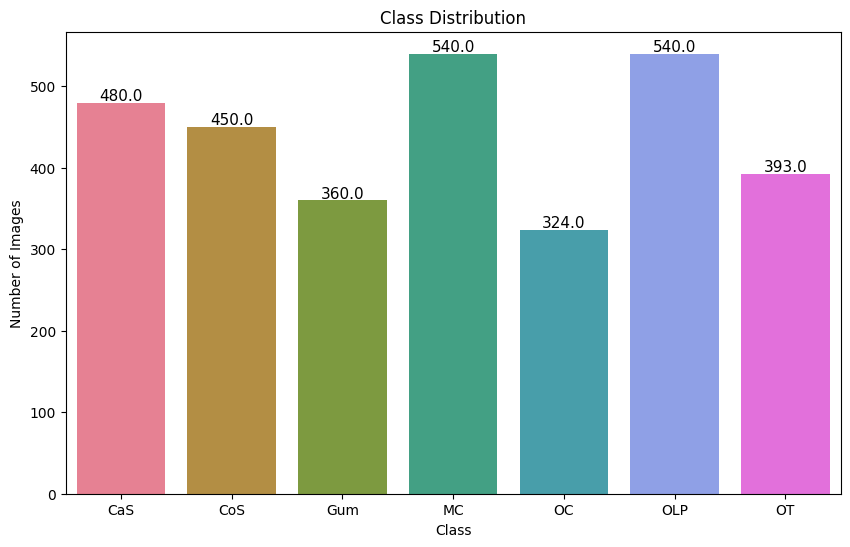

In [6]:
plot_class_counts(train_gen)

In [7]:
def plot_images_per_class(generator, num_images_per_class=3):
    
    class_indices = generator.class_indices
    class_labels = list(class_indices.keys())

    plt.figure(figsize=(15, len(class_labels) * 5))

    for i, class_label in enumerate(class_labels):
        # Filter images for the current class
        class_images = [image for image, label in zip(generator.filenames, generator.classes) if label == class_indices[class_label]]

        # Select a sample of images
        sample_images = np.random.choice(class_images, num_images_per_class, replace=False)

        for j, img_path in enumerate(sample_images):
            img = plt.imread(os.path.join(generator.directory, img_path))
            plt.subplot(len(class_labels), num_images_per_class, i * num_images_per_class + j + 1)
            plt.imshow(img)
            plt.axis('off')
            if j == 1:  # Center image in each row
                plt.title(f'Class: {class_label}', fontsize=16)

    plt.tight_layout()
    plt.show()

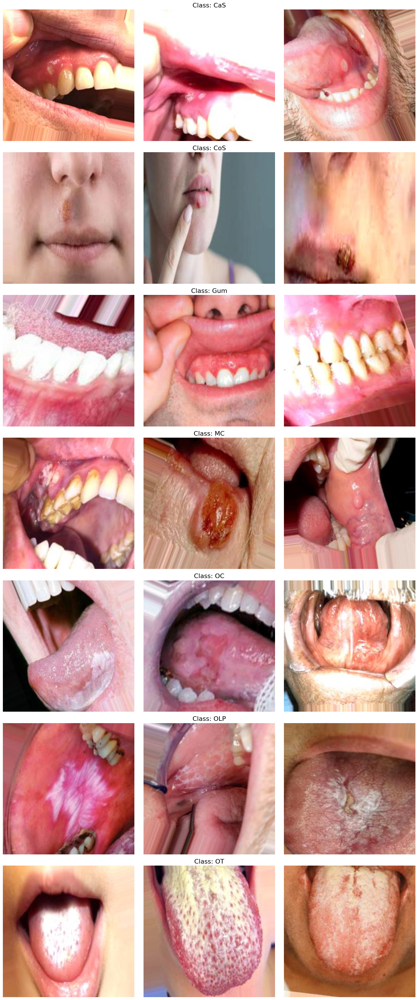

In [8]:
plot_images_per_class(train_gen)

In [9]:
# Load pretrained model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(7, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

In [10]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [11]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.00001)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [12]:
# This gets the count of each class
class_counts = np.unique(train_gen.classes, return_counts=True)[1]

# Total number of samples across all classes
total = np.sum(class_counts)

# Calculate the class weights
class_weight = {i: total / (len(class_counts) * count) for i, count in enumerate(class_counts)}

In [13]:
# Train the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    callbacks=[reduce_lr, early_stopping],
    class_weight=class_weight
)

Epoch 1/50
193/193 [==============================] - 63s 283ms/step - loss: 1.6302 - accuracy: 0.3434 - val_loss: 1.3773 - val_accuracy: 0.4660 - lr: 0.0010
Epoch 2/50
193/193 [==============================] - 48s 250ms/step - loss: 1.3120 - accuracy: 0.4730 - val_loss: 1.2954 - val_accuracy: 0.5136 - lr: 0.0010
Epoch 3/50
193/193 [==============================] - 48s 246ms/step - loss: 1.2130 - accuracy: 0.5215 - val_loss: 1.2201 - val_accuracy: 0.5447 - lr: 0.0010
Epoch 4/50
193/193 [==============================] - 49s 253ms/step - loss: 1.1275 - accuracy: 0.5594 - val_loss: 1.0707 - val_accuracy: 0.5875 - lr: 0.0010
Epoch 5/50
193/193 [==============================] - 48s 250ms/step - loss: 1.0152 - accuracy: 0.6054 - val_loss: 1.0188 - val_accuracy: 0.6109 - lr: 0.0010
Epoch 6/50
193/193 [==============================] - 48s 249ms/step - loss: 0.9908 - accuracy: 0.6100 - val_loss: 0.9451 - val_accuracy: 0.6206 - lr: 0.0010
Epoch 7/50
193/193 [==============================] 

In [14]:
# Evaluate the model on the validation set
test_loss, test_accuracy = model.evaluate(test_gen)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

65/65 [==============================] - 10s 154ms/step - loss: 0.4491 - accuracy: 0.8473
Test Loss: 0.44905388355255127
Test Accuracy: 0.8472762703895569


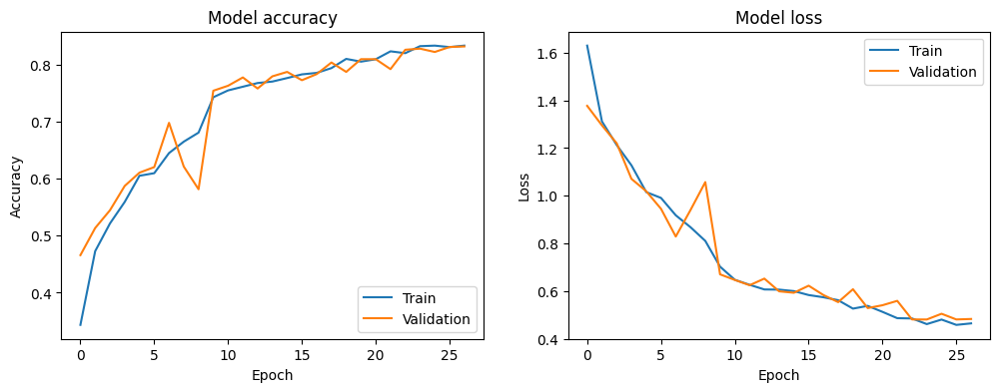

In [15]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.show()

65/65 [==============================] - 10s 153ms/step
              precision    recall  f1-score   support

         CaS       0.88      0.91      0.90       160
         CoS       0.95      0.97      0.96       149
         Gum       0.82      0.87      0.84       120
          MC       0.86      0.74      0.80       180
          OC       0.72      0.92      0.81       108
         OLP       0.85      0.74      0.79       180
          OT       0.81      0.84      0.83       131

    accuracy                           0.85      1028
   macro avg       0.84      0.86      0.85      1028
weighted avg       0.85      0.85      0.85      1028



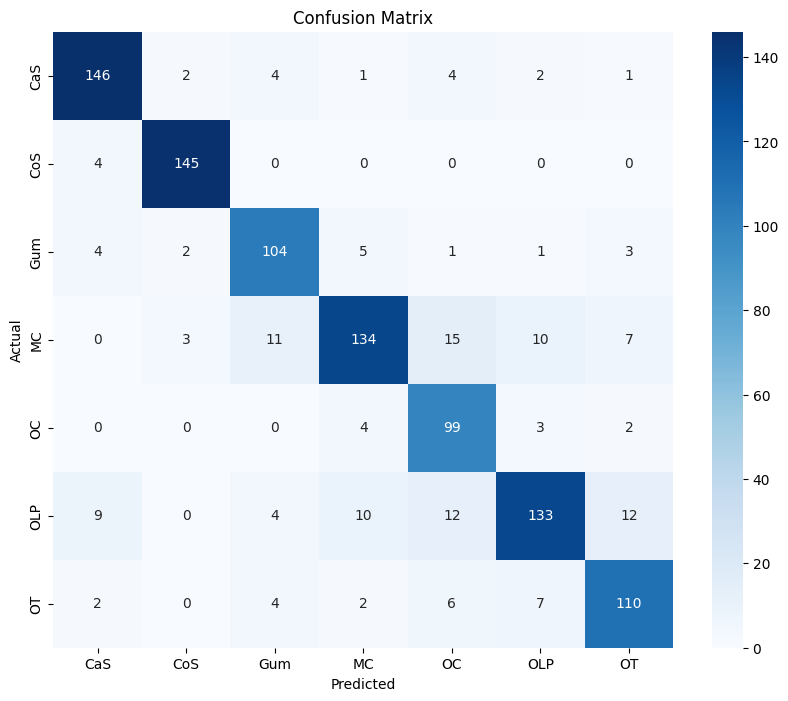

In [16]:
# Get true labels and predictions for the test set
true_labels = test_gen.classes
predictions = model.predict(test_gen)

# For multi-class classification, use argmax to get the predicted class
predicted_labels = np.argmax(predictions, axis=1)

# Extract class labels from the training generator
class_labels = list(train_gen.class_indices.keys())  # Getting class labels from the training generator

# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=class_labels))

# Plot confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

In [17]:
import matplotlib.patches as patches

def plot_images_per_class_with_predictions(model, generator, num_images_per_class=5):
    class_indices = generator.class_indices
    class_labels = list(class_indices.keys())

    plt.figure(figsize=(15, 7 * 5))

    for i, class_label in enumerate(class_labels):
        # Filter images for the current class
        class_images = [image for image, label in zip(generator.filenames, generator.classes) if label == class_indices[class_label]]

        # Select a sample of images
        sample_images = np.random.choice(class_images, num_images_per_class, replace=False)

        for j, img_path in enumerate(sample_images):
            img = plt.imread(os.path.join(generator.directory, img_path))
            plt.subplot(len(class_labels), num_images_per_class, i * num_images_per_class + j + 1)
            plt.imshow(img)
            plt.axis('off')
            
            # Predict the label for the image
            img_array = tf.keras.preprocessing.image.img_to_array(tf.keras.preprocessing.image.load_img(os.path.join(generator.directory, img_path), target_size=(224, 224)))
            img_array = np.expand_dims(img_array, axis=0) / 255.0
            prediction = model.predict(img_array)
            predicted_label = class_labels[np.argmax(prediction)]

            # Display the actual and predicted labels
            color = 'green' if predicted_label == class_label else 'red'
            title = f'Actual: {class_label}\nPredicted: {predicted_label}'
            plt.title(title, fontsize=12, color=color)

    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 21ms/step


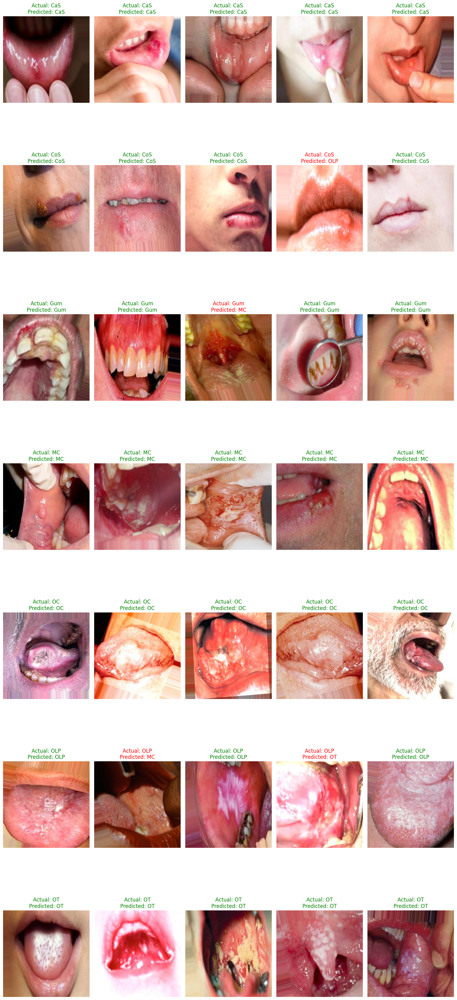

In [18]:
plot_images_per_class_with_predictions(model=model, generator=test_gen)

In [19]:
# Save the model
model.save('teeth_model.h5')

In [20]:
import streamlit as st
from PIL import Image
import numpy as np
import tensorflow as tf

# Define the class labels
class_labels = ['CaS', 'CoS', 'Gum', 'MC', 'OC', 'OLP', 'OT']

# Streamlit app
st.title("Teeth Classification")
uploaded_file = st.file_uploader("Choose an image...", type="jpg")

if uploaded_file is not None:
    image = Image.open(uploaded_file)
    st.image(image, caption='Uploaded Image.', use_column_width=True)
    img = np.array(image.resize((224, 224)))/255.0
    img = np.expand_dims(img, axis=0)

    # Load the trained model
    model = tf.keras.models.load_model('/content/sample_data/teeth_model.h5')
    
    # Make predictions
    predictions = model.predict(img)
    predicted_class = np.argmax(predictions, axis=1)[0]
    predicted_label = class_labels[predicted_class]
    
    # Display the predicted label
    st.write(f"Predicted Label: {predicted_label}")

2024-08-28 20:44:32.630 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-08-28 20:44:33.707 
  command:

    streamlit run c:\Users\atiya\AppData\Local\anaconda3\envs\GPusupport\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]
2024-08-28 20:44:33.708 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-08-28 20:44:33.709 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-08-28 20:44:33.710 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-08-28 20:44:33.710 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-08-28 20:44:33.711 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


# click on this link to open my colab notebook
# this was the only way to run streamlit app 

https://colab.research.google.com/drive/1WaLyjWgoQ20BG9qWESNNmtCRhP6vJNk_?authuser=1#scrollTo=xN9tEVd-Rpzp